In [1]:
import cv2
import logging, os
import tensorflow as tf
import imutils as utils
import numpy as np
import glob

from PIL import Image, ImageDraw, ImageFont
from sklearn.metrics import accuracy_score, confusion_matrix
from matplotlib import pyplot as plt
from scipy.ndimage.interpolation import rotate

from utils import ops as utils_ops
from utils import label_map_util
from utils import visualization_utils as vis_util

%matplotlib inline

In [2]:
logging.disable(logging.WARNING)
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only use the first GPU
    try:
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
        # Visible devices must be set before GPUs have been initialized
        print(e)

In [4]:
# read background image for shading correction
imgbackground = cv2.imread('../../img/Other/image_100.jpg')

In [5]:
#  machine learning stuff
labelmap_path = "../../config/labelmap.pbtxt"
category_index = label_map_util.create_category_index_from_labelmap(
    labelmap_path, use_display_name=True)
tf.keras.backend.clear_session()
model = tf.saved_model.load('../../model/saved_model')

Scores:  [0.93367016 0.11604095 0.0346486 ]
Boxes:  [[0.07521611 0.338757   0.7591687  0.7634231 ]
 [0.07595694 0.33245063 0.7605938  0.7615893 ]
 [0.         0.         0.9649758  0.6544025 ]]
Classes:  [2 3 1]


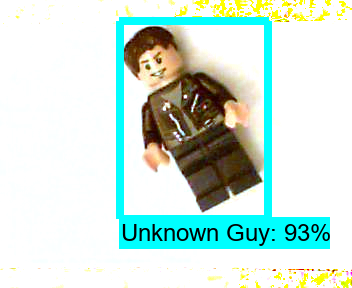

Scores:  [0.9997654 0.8692032 0.4419263]
Boxes:  [[0.23590823 0.27249068 0.82447106 0.7013935 ]
 [0.17760178 0.77968097 0.9117841  0.9963038 ]
 [0.19218726 0.0045256  0.8221748  0.13647549]]
Classes:  [1 2 3]


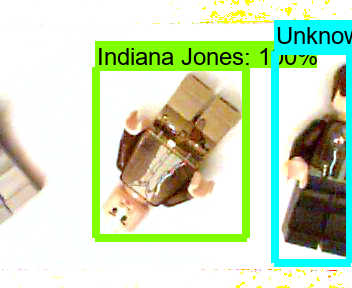

Scores:  [0.9989397  0.93344915 0.40234149]
Boxes:  [[0.39167237 0.25154415 0.82620823 0.7859999 ]
 [0.1950885  0.00280532 0.8403625  0.1964723 ]
 [0.1866742  0.00178369 0.8442251  0.19680828]]
Classes:  [1 3 2]


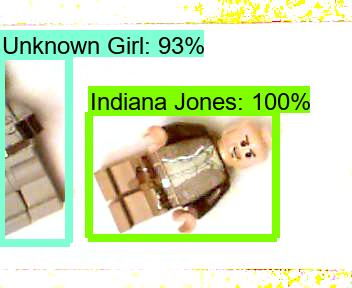

Scores:  [0.9653977  0.89504147 0.03753692]
Boxes:  [[0.13774419 0.3986478  0.8482518  0.74806213]
 [0.11960743 0.72221535 0.851583   0.99962693]
 [0.1607075  0.69939345 0.8586141  1.        ]]
Classes:  [3 2 1]


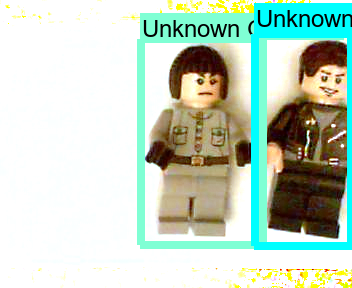

Scores:  [0.99828976 0.13481739 0.11944544]
Boxes:  [[0.16497946 0.42219478 0.9014999  0.80119926]
 [0.28921446 0.         0.83782923 0.10124056]
 [0.27082035 0.00421998 0.8738766  0.10010031]]
Classes:  [1 3 2]


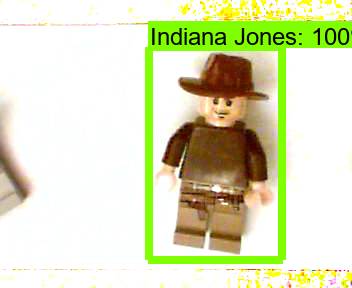

Scores:  [0.9998793  0.9883243  0.03951949]
Boxes:  [[0.17838432 0.27481455 0.84292567 0.78228337]
 [0.18412638 0.00426848 0.70137656 0.21696234]
 [0.12373921 0.00168387 0.7519727  0.22837418]]
Classes:  [1 3 2]


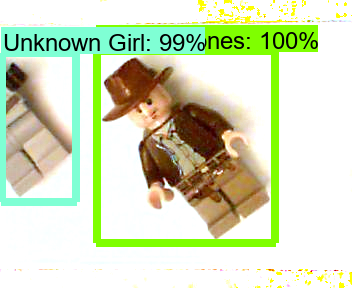

Scores:  [0.999262   0.11291659 0.10002798]
Boxes:  [[0.13157825 0.394444   0.8511745  0.7476903 ]
 [0.3973142  0.00160282 0.77812433 0.18288073]
 [0.25025988 0.00337552 0.7622021  0.19283718]]
Classes:  [1 2 3]


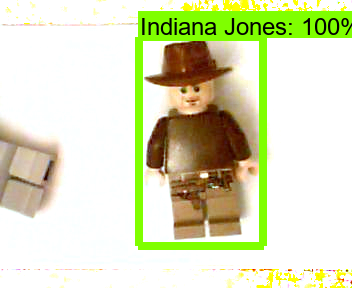

Scores:  [0.99799    0.09039503 0.08339974]
Boxes:  [[0.17682174 0.3166296  0.8999116  0.6996861 ]
 [0.26700187 0.9667315  0.8823932  0.99558467]
 [0.26700187 0.9667315  0.8823932  0.99558467]]
Classes:  [1 3 2]


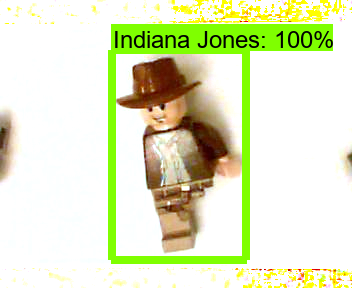

Scores:  [0.9965922  0.06060743 0.04332435]
Boxes:  [[0.16017778 0.42108214 0.8919955  0.79675496]
 [0.71581495 0.         1.         0.84346235]
 [0.16484402 0.41553038 0.8964057  0.7999448 ]]
Classes:  [1 3 2]


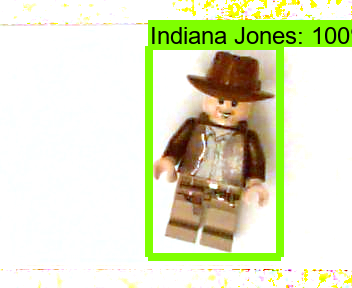

Scores:  [0.9977427  0.18822217 0.12889692]
Boxes:  [[0.15686356 0.42332885 0.89116627 0.8112956 ]
 [0.28970355 0.00248688 0.73450935 0.20951186]
 [0.27422333 0.00132059 0.7272085  0.20812675]]
Classes:  [1 2 3]


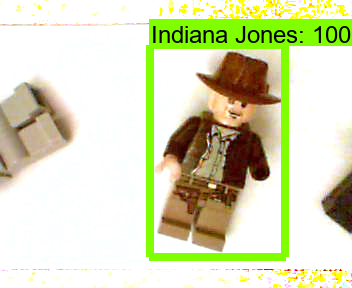

Scores:  [0.9352803  0.90005755 0.22505355]
Boxes:  [[0.22346197 0.6220598  0.7312988  1.        ]
 [0.2673985  0.01334262 0.7500083  0.4730066 ]
 [0.25221384 0.         0.7413948  0.46157822]]
Classes:  [2 3 1]


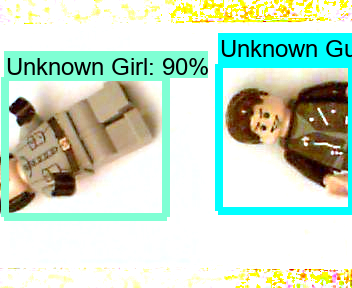

Scores:  [0.99813867 0.96309733 0.08879277]
Boxes:  [[1.18284896e-01 4.44458365e-01 8.32951903e-01 8.64301801e-01]
 [1.71123385e-01 5.75020909e-04 7.41576314e-01 3.28992724e-01]
 [1.81766927e-01 0.00000000e+00 7.41223991e-01 3.47684860e-01]]
Classes:  [1 3 2]


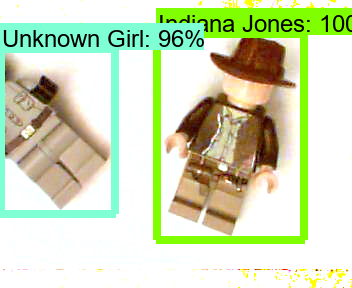

Scores:  [0.9980431  0.93781507 0.80621195]
Boxes:  [[0.18397216 0.2740621  0.8683874  0.6476195 ]
 [0.265943   0.00262132 0.77844715 0.2431849 ]
 [0.22799237 0.7805882  0.66368973 0.99682003]]
Classes:  [1 2 3]


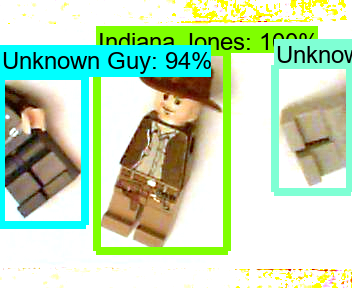

Scores:  [0.9988409  0.06183261 0.04334798]
Boxes:  [[0.15228775 0.47058976 0.880626   0.8112184 ]
 [0.01611193 0.00234098 0.63195145 0.10114872]
 [0.6931659  0.9592332  1.         0.9997756 ]]
Classes:  [1 3 2]


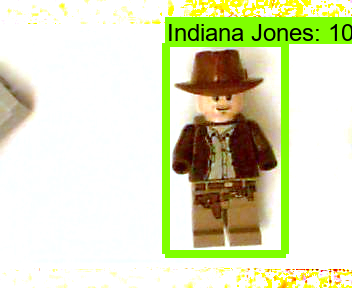

Scores:  [0.99860203 0.966344   0.14309883]
Boxes:  [[0.12735066 0.5275294  0.85218215 0.8999453 ]
 [0.03215457 0.00229764 0.73147416 0.27466634]
 [0.0299715  0.00204878 0.72907805 0.2731195 ]]
Classes:  [1 3 2]


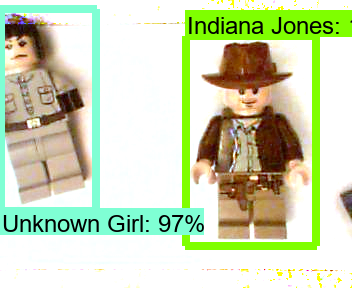

Scores:  [0.998633   0.2641785  0.13413227]
Boxes:  [[0.10956339 0.35953945 0.8532412  0.70775896]
 [0.34621787 0.89267373 0.85429    1.        ]
 [0.09419204 0.00270221 0.7280292  0.22535282]]
Classes:  [1 2 3]


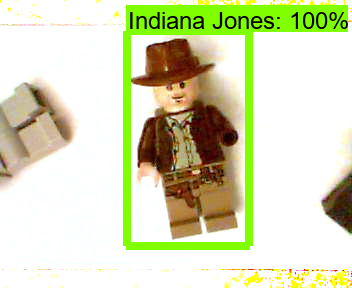

Scores:  [0.9968898  0.04647982 0.03077319]
Boxes:  [[0.131892   0.28894502 0.84898186 0.64749295]
 [0.14268188 0.28036946 0.84939647 0.6471518 ]
 [0.6572386  0.01144384 1.         0.3053764 ]]
Classes:  [1 2 3]


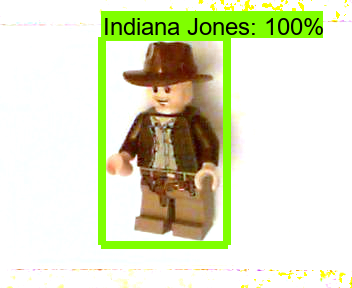

Scores:  [0.99966264 0.8623848  0.09307727]
Boxes:  [[0.24731624 0.20154133 0.9123199  0.55705357]
 [0.18155484 0.781989   0.91464156 0.99617195]
 [0.90925574 0.7278131  1.         1.        ]]
Classes:  [1 2 3]


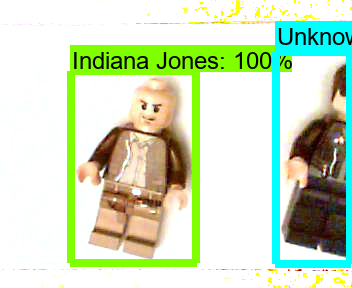

Scores:  [0.99909186 0.5891457  0.40329155]
Boxes:  [[0.2497893  0.422449   0.9048761  0.81424963]
 [0.1858191  0.00134037 0.8559798  0.15834674]
 [0.18357798 0.00242187 0.8585439  0.16025172]]
Classes:  [1 3 2]


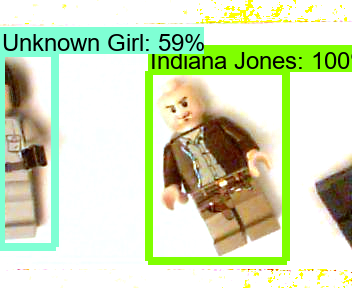

Scores:  [0.99943507 0.77178913 0.06222126]
Boxes:  [[0.2796271  0.40357882 0.88289005 0.756368  ]
 [0.20538843 0.82331055 0.7730606  0.9969943 ]
 [0.09024218 0.00484759 0.66858774 0.1453841 ]]
Classes:  [1 2 3]


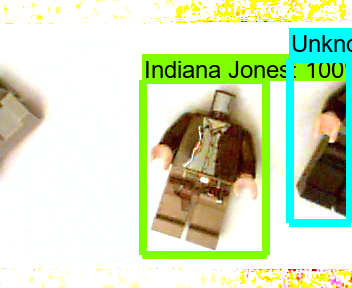

Scores:  [0.9997426  0.05997771 0.04604888]
Boxes:  [[0.15325178 0.30571145 0.82673883 0.8228776 ]
 [0.03701021 0.         0.6378999  0.10144365]
 [0.15910067 0.3073727  0.831623   0.825783  ]]
Classes:  [1 3 2]


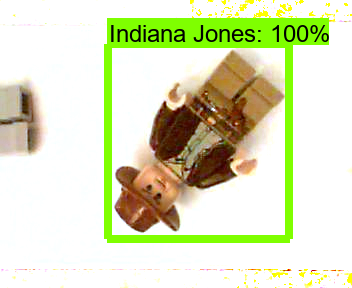

Scores:  [0.99935246 0.97046125 0.06467441]
Boxes:  [[0.15410587 0.3503831  0.8261987  0.7889407 ]
 [0.27374998 0.00404012 0.79400826 0.18936157]
 [0.15476546 0.3517989  0.8287246  0.79237163]]
Classes:  [1 3 2]


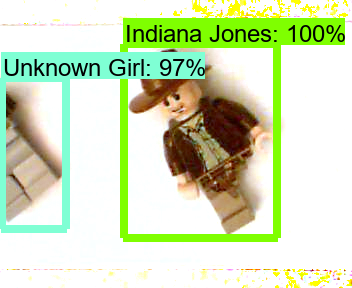

Scores:  [0.9991406  0.07601383 0.06136224]
Boxes:  [[0.19290417 0.35419214 0.84109783 0.76373327]
 [0.2672869  0.9670482  0.87519616 0.99603635]
 [0.28934693 0.9650457  0.8415223  0.99652886]]
Classes:  [1 3 2]


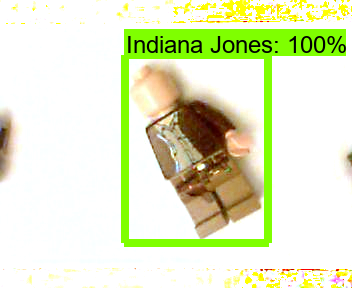

Scores:  [0.9992261  0.98986036 0.32011023]
Boxes:  [[0.13625233 0.25270176 0.84588325 0.6280683 ]
 [0.18614909 0.00441731 0.6984362  0.21786615]
 [0.19506608 0.84564495 0.84128547 0.9980744 ]]
Classes:  [1 3 2]


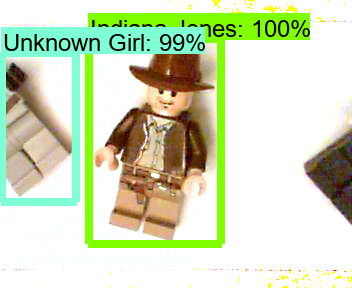

Scores:  [0.9998973  0.98775727 0.31230158]
Boxes:  [[0.177748   0.27633736 0.8437083  0.78602326]
 [0.19225317 0.00441417 0.7000563  0.21584488]
 [0.18339992 0.8496239  0.8237356  1.        ]]
Classes:  [1 3 2]


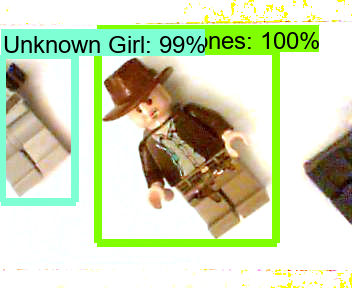

Scores:  [0.9971871  0.12674245 0.07567269]
Boxes:  [[0.15702853 0.40590674 0.8960511  0.8110809 ]
 [0.16393709 0.9218799  0.7496842  0.99774647]
 [0.15662415 0.9233468  0.7360299  0.9984179 ]]
Classes:  [1 3 2]


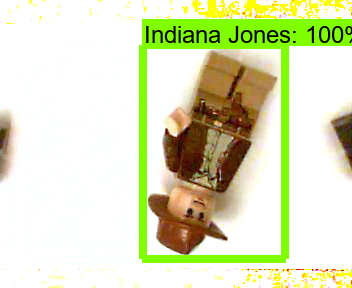

Scores:  [0.99937844 0.9878218  0.02699372]
Boxes:  [[0.1967949  0.48672792 0.9207825  0.85879135]
 [0.25744322 0.00425316 0.7750149  0.21057221]
 [0.6990901  0.9646647  1.         0.9974946 ]]
Classes:  [1 3 2]


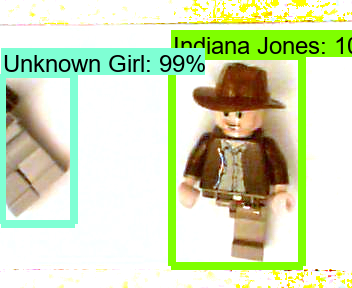

Scores:  [0.9493154  0.568639   0.03525692]
Boxes:  [[0.14287744 0.00263458 0.8380028  0.19792965]
 [0.15951593 0.83770245 0.9020778  0.99824065]
 [0.1515658  0.83546054 0.89946806 0.9952048 ]]
Classes:  [3 2 1]


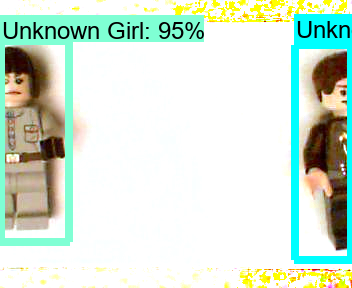

Scores:  [0.9985961  0.20771232 0.04181978]
Boxes:  [[0.24104765 0.20642683 0.8125631  0.78741646]
 [0.14971912 0.8931934  0.6882365  0.99881417]
 [0.157076   0.893455   0.675914   0.99754333]]
Classes:  [1 3 2]


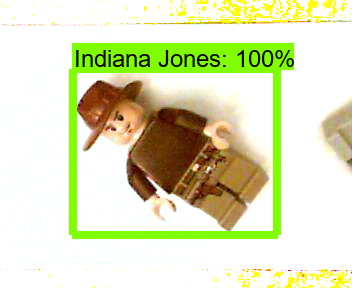

Scores:  [0.99925524 0.9800106  0.02804297]
Boxes:  [[0.11931867 0.433002   0.83477074 0.790882  ]
 [0.26419714 0.00419791 0.78802973 0.19618836]
 [0.26807064 0.00298977 0.7873642  0.19458716]]
Classes:  [1 3 2]


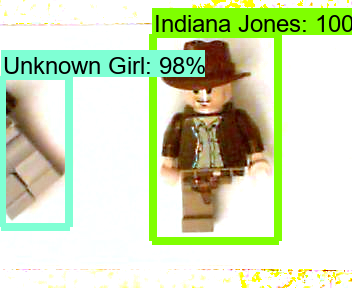

Scores:  [0.99807775 0.4272059  0.04542756]
Boxes:  [[1.7338090e-01 3.0604523e-01 8.4355628e-01 7.2279555e-01]
 [3.5722414e-01 4.9021095e-05 8.3080363e-01 1.2374848e-01]
 [2.1502581e-01 9.5018417e-01 8.4169102e-01 9.9814576e-01]]
Classes:  [1 2 3]


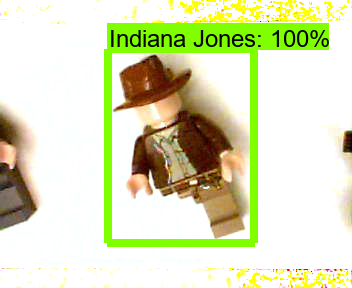

Scores:  [0.9978163  0.16916665 0.11842367]
Boxes:  [[0.22403428 0.3554901  0.8198747  0.92774415]
 [0.2880981  0.00236931 0.7376642  0.2072047 ]
 [0.27465123 0.00107807 0.7298638  0.20760955]]
Classes:  [1 2 3]


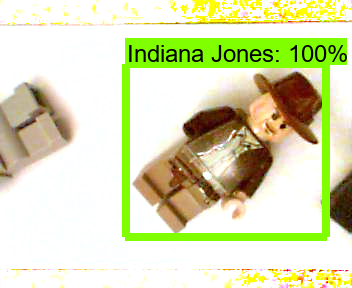

Scores:  [0.97980285 0.11475506 0.01540896]
Boxes:  [[0.09671112 0.46474636 0.79692894 0.88208795]
 [0.0956315  0.4640302  0.8005016  0.8815095 ]
 [0.00668222 0.         1.         0.9146832 ]]
Classes:  [3 2 1]


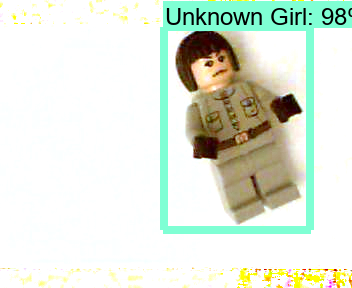

Scores:  [0.99776745 0.59493697 0.03431401]
Boxes:  [[1.7816035e-01 3.8064292e-01 8.3138114e-01 8.1078768e-01]
 [3.6440459e-01 7.8346580e-04 8.6591536e-01 1.5675583e-01]
 [9.6518421e-01 6.1395764e-04 1.0000000e+00 2.6463011e-01]]
Classes:  [1 2 3]


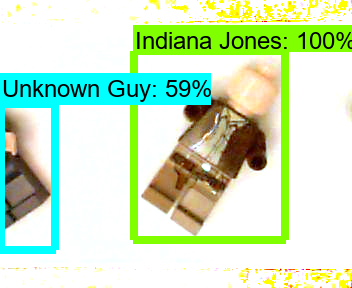

Scores:  [0.9960681  0.9875791  0.02822343]
Boxes:  [[0.14944586 0.4078464  0.8345286  0.82839197]
 [0.25286648 0.0041607  0.77567476 0.2100289 ]
 [0.21632783 0.01395153 0.8440113  0.23324257]]
Classes:  [1 3 2]


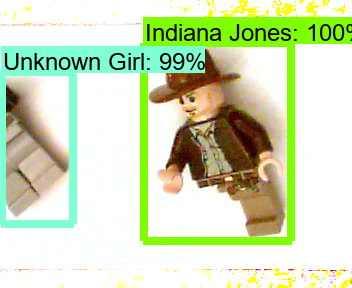

Scores:  [0.9997029  0.97666734 0.03691915]
Boxes:  [[1.5851592e-01 4.7111213e-01 8.9305699e-01 8.8915431e-01]
 [2.2033483e-01 6.5483153e-04 8.1280237e-01 2.6067156e-01]
 [2.0132443e-01 0.0000000e+00 8.2495254e-01 2.6437718e-01]]
Classes:  [1 3 2]


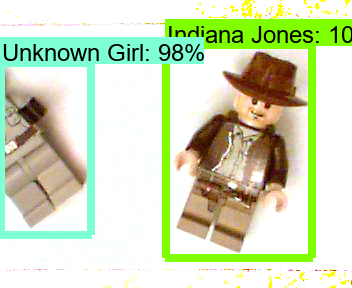

Scores:  [0.9993372  0.97149026 0.8670249 ]
Boxes:  [[1.2027200e-01 3.1498295e-01 7.9552263e-01 6.7820704e-01]
 [1.8338878e-01 7.4401498e-04 7.8444612e-01 2.6885849e-01]
 [1.7373917e-01 7.7883577e-01 9.0990078e-01 9.9659276e-01]]
Classes:  [1 3 2]


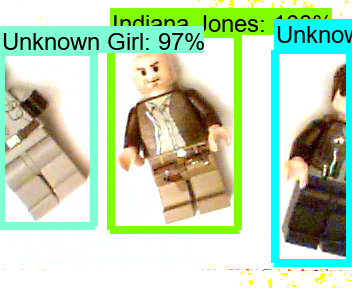

Scores:  [0.9718306  0.7105319  0.08298901]
Boxes:  [[0.11133381 0.52219087 0.73415756 0.8859028 ]
 [0.10810637 0.51826507 0.7389408  0.885166  ]
 [0.11133381 0.52219087 0.73415756 0.8859028 ]]
Classes:  [1 2 3]


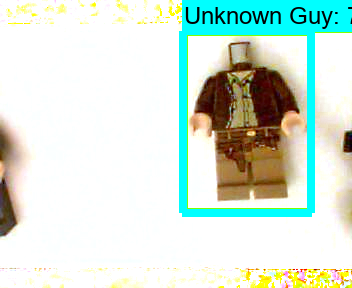

Scores:  [0.99933386 0.2788884  0.21709856]
Boxes:  [[0.15485746 0.35359594 0.82273805 0.7949164 ]
 [0.26872376 0.90659714 0.74115396 0.9991584 ]
 [0.14548168 0.00208188 0.80581367 0.10387376]]
Classes:  [1 2 3]


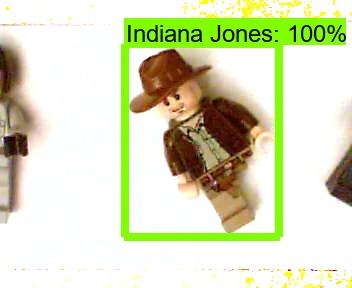

Scores:  [0.9992777  0.63026243 0.03662315]
Boxes:  [[1.4707237e-01 3.7045187e-01 8.8257968e-01 7.1623272e-01]
 [3.7078255e-01 6.3593686e-04 8.6587399e-01 1.5777858e-01]
 [4.9640825e-01 4.2063817e-03 1.0000000e+00 2.0903155e-01]]
Classes:  [1 2 3]


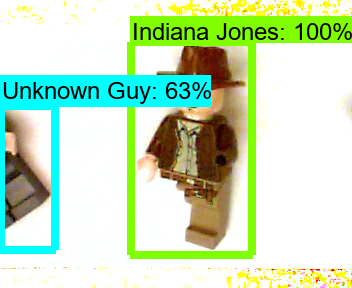

Scores:  [0.996591   0.48444095 0.17734629]
Boxes:  [[0.3311946  0.17522958 0.7822821  0.7826437 ]
 [0.32918075 0.         0.79989964 0.14921531]
 [0.34911805 0.15772751 0.7844305  0.7652129 ]]
Classes:  [1 2 3]


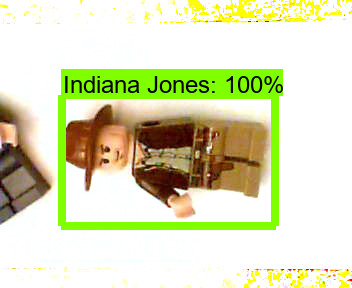

Scores:  [0.9997157  0.4715828  0.05163941]
Boxes:  [[2.16611519e-01 4.52028185e-01 8.21656704e-01 8.43232751e-01]
 [3.53878498e-01 4.86459583e-04 8.19644034e-01 1.21449724e-01]
 [2.11974472e-01 9.45061564e-01 8.13191354e-01 9.98298287e-01]]
Classes:  [1 2 3]


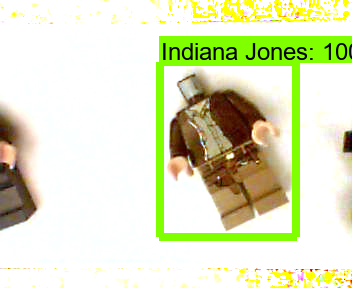

Scores:  [0.99932826 0.98712707 0.94298327]
Boxes:  [[0.1646238  0.34424186 0.87481457 0.7449461 ]
 [0.2589595  0.00426783 0.77598274 0.20502377]
 [0.21841006 0.7568111  0.67348236 0.99863404]]
Classes:  [1 3 2]


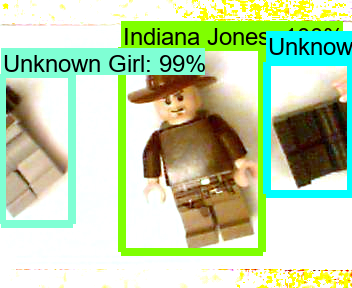

Scores:  [0.9990763 0.9850872 0.0402081]
Boxes:  [[0.09404018 0.3106988  0.803239   0.7496987 ]
 [0.25190622 0.00396574 0.7744449  0.20917934]
 [0.21042944 0.00848633 0.83120084 0.22848645]]
Classes:  [1 3 2]


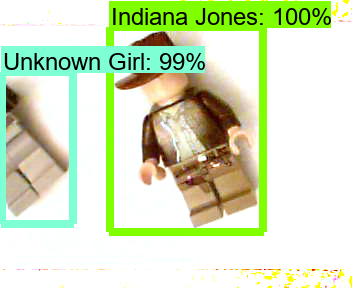

Scores:  [0.9996152  0.81082726 0.10715735]
Boxes:  [[0.31884333 0.25531197 0.7902085  0.71575826]
 [0.2306682  0.82273185 0.7736335  0.9974302 ]
 [0.         0.         0.6745903  0.14224315]]
Classes:  [1 2 3]


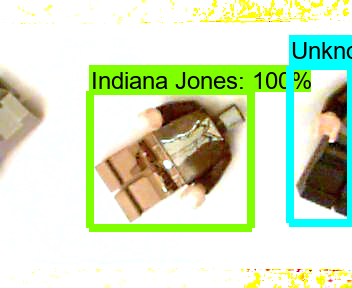

Scores:  [0.9987238  0.11344296 0.07107237]
Boxes:  [[0.08198053 0.3720675  0.83121467 0.72269624]
 [0.2451885  0.00304423 0.76086926 0.19362473]
 [0.39238885 0.001762   0.77458763 0.18257473]]
Classes:  [1 3 2]


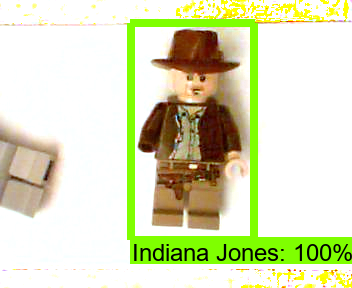

Scores:  [0.9993416  0.2912845  0.22707722]
Boxes:  [[0.11700556 0.3851784  0.82084954 0.7483339 ]
 [0.28387448 0.9071578  0.73588985 0.9979832 ]
 [0.14411967 0.00163656 0.80096424 0.10517071]]
Classes:  [1 2 3]


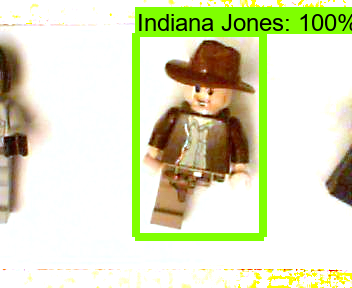

Scores:  [0.96074384 0.11814049 0.03689328]
Boxes:  [[0.14780505 0.6038837  0.8826554  0.9909645 ]
 [0.15201676 0.6118163  0.864956   0.9862925 ]
 [0.         0.         1.         0.8844291 ]]
Classes:  [3 2 1]


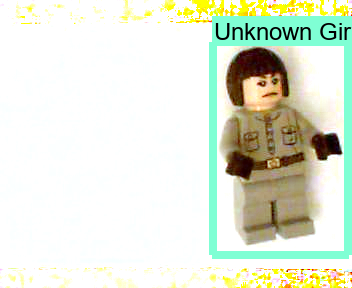

Scores:  [0.9978906 0.9864487 0.9531871]
Boxes:  [[0.11440796 0.28031057 0.8524361  0.65121585]
 [0.144202   0.00379733 0.6535198  0.23472792]
 [0.41265187 0.7062153  0.9135786  0.9967037 ]]
Classes:  [1 3 2]


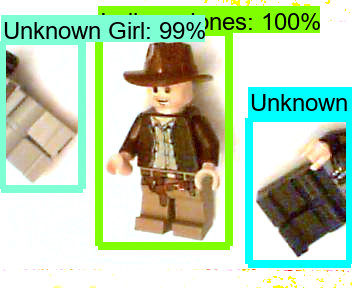

Scores:  [0.9983074  0.9844682  0.19355059]
Boxes:  [[0.12093253 0.4737895  0.8288344  0.8526005 ]
 [0.17361413 0.         0.65647924 0.40781313]
 [0.17144792 0.0010258  0.6610742  0.40827954]]
Classes:  [1 3 2]


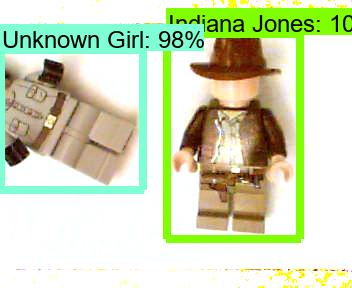

Scores:  [0.9991629  0.93240047 0.39011875]
Boxes:  [[0.21341376 0.3398097  0.87281007 0.7080178 ]
 [0.18221463 0.00302286 0.8404868  0.19960746]
 [0.17475936 0.00206157 0.85021144 0.20217112]]
Classes:  [1 3 2]


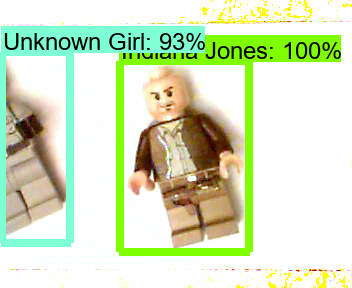

Scores:  [0.99988306 0.8029508  0.10367584]
Boxes:  [[0.17250486 0.29868513 0.77392524 0.6659607 ]
 [0.21618101 0.82074845 0.7799933  0.9971291 ]
 [0.         0.         0.6688888  0.14811486]]
Classes:  [1 2 3]


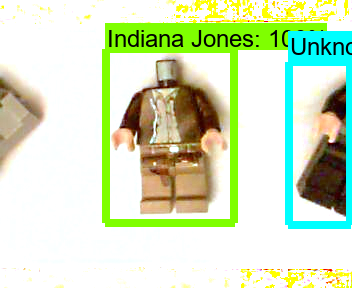

Scores:  [0.99748194 0.987313   0.06392667]
Boxes:  [[0.17650686 0.3521186  0.7851059  0.88376725]
 [0.2544375  0.00396591 0.77627265 0.21166319]
 [0.17837405 0.3515386  0.7875237  0.88488096]]
Classes:  [1 3 2]


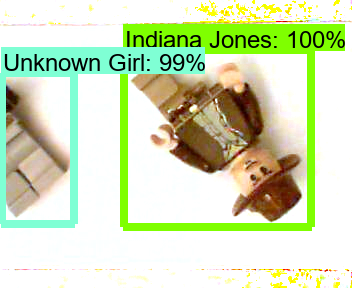

Scores:  [0.99887556 0.78472376 0.09896615]
Boxes:  [[0.31732103 0.35218552 0.7532857  0.7999997 ]
 [0.35866576 0.00109925 0.82671803 0.16729268]
 [0.337534   0.35056877 0.74700946 0.8029499 ]]
Classes:  [1 2 3]


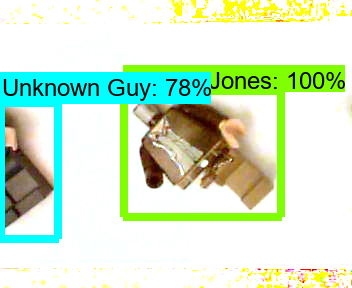

Scores:  [0.9966322  0.6272439  0.05493999]
Boxes:  [[1.3238129e-01 5.5078197e-01 8.8778698e-01 9.7345972e-01]
 [3.4336275e-01 8.4710866e-04 8.1031334e-01 1.6134396e-01]
 [7.4747080e-01 0.0000000e+00 1.0000000e+00 1.0000000e+00]]
Classes:  [1 2 3]


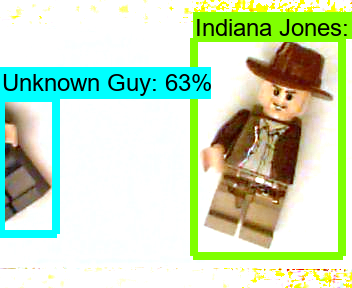

Scores:  [0.99847597 0.72576916 0.03791359]
Boxes:  [[0.17472683 0.330014   0.8751207  0.72754633]
 [0.36558774 0.00183377 0.8353254  0.16052133]
 [0.35212216 0.00173322 0.84021217 0.15880358]]
Classes:  [1 2 3]


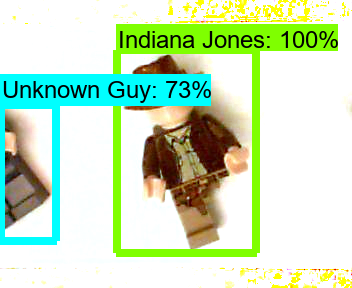

Scores:  [0.99961346 0.12868041 0.09784743]
Boxes:  [[0.13522048 0.3123328  0.851836   0.7599153 ]
 [0.30839273 0.         0.8428919  0.09940755]
 [0.2987429  0.         0.8390128  0.10052641]]
Classes:  [1 3 2]


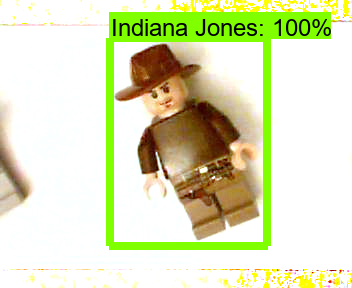

Scores:  [0.99765956 0.9607976  0.07028842]
Boxes:  [[0.11994224 0.43399516 0.84912854 0.8488933 ]
 [0.06710526 0.         0.6402196  0.32097328]
 [0.07776283 0.         0.65275353 0.32563466]]
Classes:  [1 3 2]


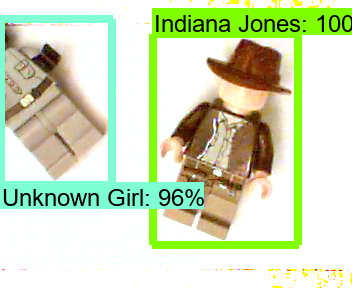

Scores:  [0.9972228  0.99005944 0.0422698 ]
Boxes:  [[0.2946379  0.24952298 0.7535224  0.84622115]
 [0.16881794 0.00316855 0.68249303 0.23435667]
 [0.11939351 0.01206401 0.7356336  0.2317673 ]]
Classes:  [1 3 2]


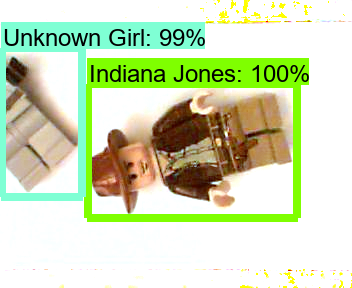

Scores:  [0.99990344 0.16793433 0.1390706 ]
Boxes:  [[0.20160419 0.34432915 0.8877944  0.8215561 ]
 [0.29041806 0.0025946  0.72895336 0.21013072]
 [0.2898665  0.00122092 0.73277414 0.2116516 ]]
Classes:  [1 2 3]


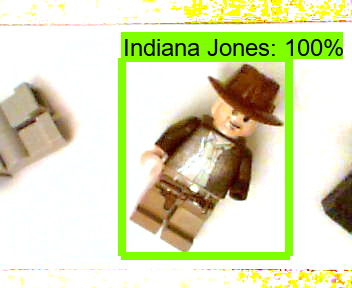

Scores:  [0.99940765 0.6055159  0.3617584 ]
Boxes:  [[0.2617613  0.3703909  0.9284303  0.7293024 ]
 [0.17962858 0.0030349  0.8571584  0.15907687]
 [0.17962858 0.0030349  0.8571584  0.15907687]]
Classes:  [1 3 2]


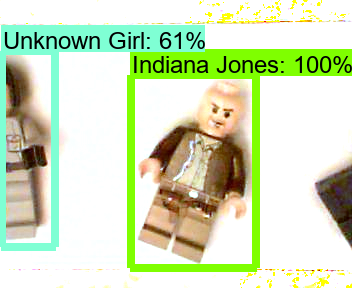

Scores:  [0.96644527 0.21782306 0.08857679]
Boxes:  [[0.23038763 0.12528354 0.70254254 0.7048834 ]
 [0.2344123  0.12339985 0.70851004 0.7132842 ]
 [0.29684183 0.94003975 0.88368696 0.9978483 ]]
Classes:  [3 1 2]


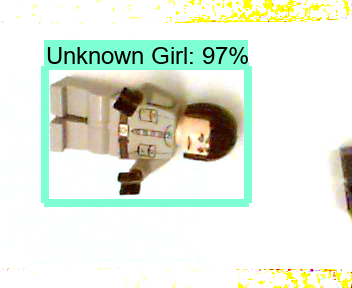

Scores:  [0.9997295  0.51491666 0.08477795]
Boxes:  [[2.46412799e-01 3.99930000e-01 8.47710669e-01 7.61010289e-01]
 [3.53776664e-01 4.32059169e-04 8.19340289e-01 1.22626804e-01]
 [2.47209549e-01 9.45381701e-01 8.73801351e-01 9.98050153e-01]]
Classes:  [1 2 3]


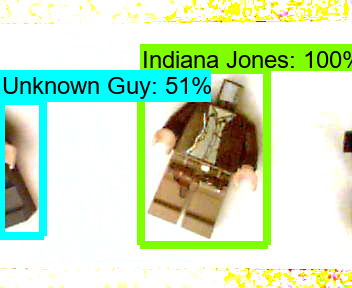

Scores:  [0.9992275  0.971067   0.12113532]
Boxes:  [[1.3940954e-01 4.6897912e-01 8.5522443e-01 8.5772836e-01]
 [1.6283827e-01 3.0502677e-05 7.5902742e-01 3.6890149e-01]
 [1.7569844e-01 0.0000000e+00 7.5597256e-01 3.8020781e-01]]
Classes:  [1 3 2]


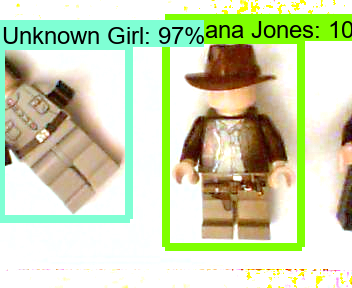

Scores:  [0.9984116  0.9642494  0.49449882]
Boxes:  [[0.1535645  0.27200973 0.8532373  0.67607665]
 [0.19915475 0.0045239  0.7210065  0.18610547]
 [0.26909894 0.8133536  0.8713881  0.99767655]]
Classes:  [1 3 2]


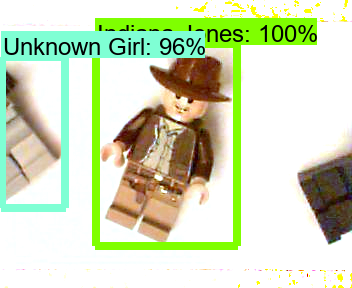

Scores:  [0.99842644 0.96393716 0.14401135]
Boxes:  [[0.17572404 0.4046749  0.8782645  0.7725712 ]
 [0.36095172 0.         0.802002   0.322225  ]
 [0.33769837 0.         0.8145075  0.3304582 ]]
Classes:  [1 2 3]


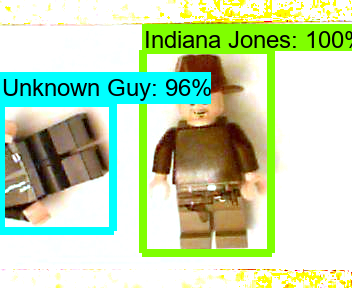

Scores:  [0.99958336 0.9874345  0.3396011 ]
Boxes:  [[0.12136178 0.38174123 0.8462312  0.769857  ]
 [0.18592256 0.0037808  0.70444375 0.22174089]
 [0.17463638 0.84440047 0.8411914  0.9993569 ]]
Classes:  [1 3 2]


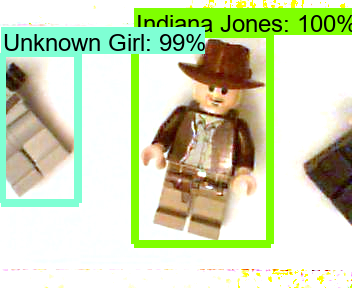

Scores:  [0.99962914 0.4870944  0.05623719]
Boxes:  [[0.29655793 0.35444272 0.8740156  0.77500033]
 [0.33520302 0.00471701 0.8238163  0.11996023]
 [0.2033398  0.9491997  0.84895635 0.9981153 ]]
Classes:  [1 2 3]


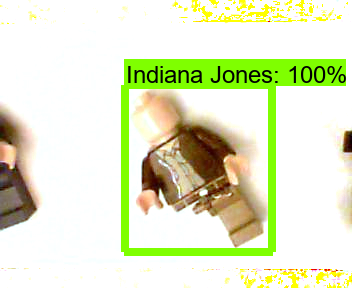

Scores:  [0.999422   0.9449501  0.91145265]
Boxes:  [[0.09615907 0.3196617  0.8408337  0.65945077]
 [0.261995   0.00119182 0.7672358  0.25610894]
 [0.22865601 0.7751049  0.6673936  0.9964919 ]]
Classes:  [1 2 3]


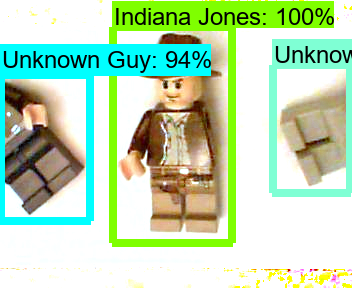

Scores:  [0.9988458  0.9719429  0.03565776]
Boxes:  [[0.10680315 0.46055704 0.79069453 0.8671134 ]
 [0.2750302  0.00394657 0.7931941  0.1908091 ]
 [0.27930966 0.00299527 0.79253054 0.18991241]]
Classes:  [1 3 2]


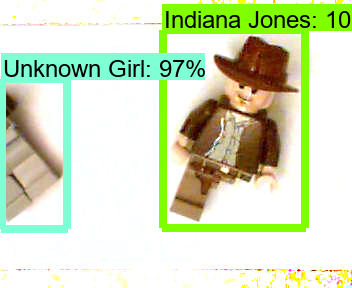

Scores:  [0.99885464 0.95802456 0.13651422]
Boxes:  [[0.17199452 0.49053484 0.9136639  0.8934402 ]
 [0.2757441  0.         0.7444487  0.30994308]
 [0.2722569  0.         0.7384377  0.3088255 ]]
Classes:  [1 2 3]


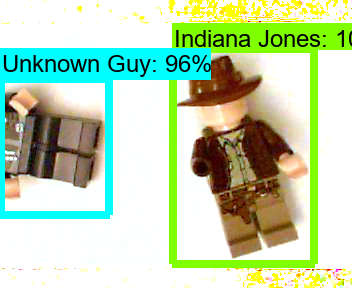

Scores:  [0.99920744 0.10839581 0.07440215]
Boxes:  [[0.12646444 0.21096939 0.8018352  0.6767642 ]
 [0.28270465 0.         0.8204466  0.10082676]
 [0.2881464  0.         0.8171657  0.09983651]]
Classes:  [1 2 3]


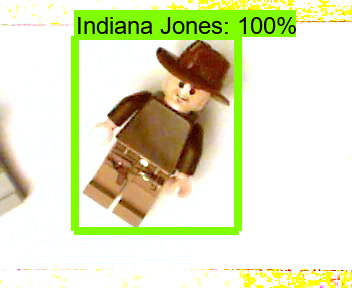

Scores:  [0.9980062  0.07745999 0.03708884]
Boxes:  [[0.2964896  0.23994586 0.7551448  0.8420441 ]
 [0.2964896  0.23994586 0.7551448  0.8420441 ]
 [0.2690414  0.00218803 0.5981051  0.12828976]]
Classes:  [1 3 2]


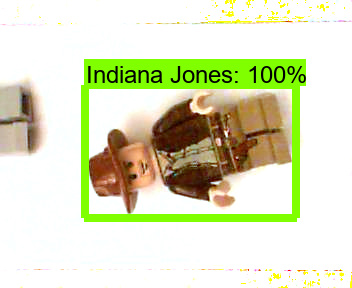

Scores:  [0.9995856  0.08589467 0.02508175]
Boxes:  [[0.22558679 0.433812   0.8361077  0.80965126]
 [0.         0.00219499 0.62909913 0.10480776]
 [0.72670996 0.         1.         0.52411723]]
Classes:  [1 3 2]


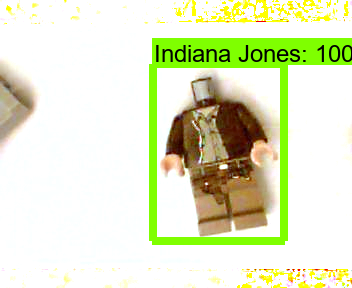

Scores:  [0.99940634 0.85215855 0.07316604]
Boxes:  [[0.2158849  0.14780554 0.8639833  0.5232979 ]
 [0.1779114  0.78243166 0.9130854  0.9961665 ]
 [0.9064939  0.7246576  1.         1.        ]]
Classes:  [1 2 3]


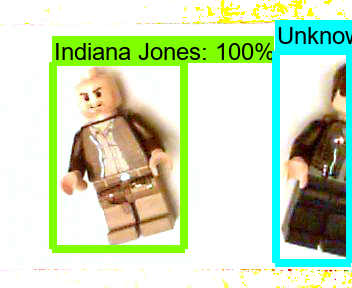

Scores:  [0.9286686  0.76500005 0.20252311]
Boxes:  [[0.13583298 0.5756978  0.85628873 0.9621905 ]
 [0.13583298 0.5756978  0.85628873 0.9621905 ]
 [0.13583298 0.5756978  0.85628873 0.9621905 ]]
Classes:  [2 1 3]


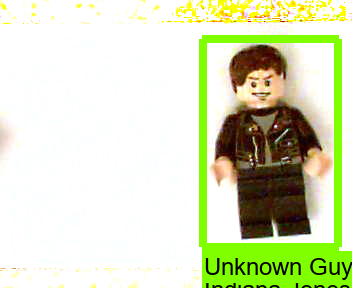

Scores:  [0.9985591  0.89171624 0.20449436]
Boxes:  [[1.20129175e-01 4.01256204e-01 8.50661874e-01 7.88633585e-01]
 [1.13854498e-01 6.46397471e-04 8.17813575e-01 2.44026765e-01]
 [1.02670752e-01 7.53708929e-03 8.36718440e-01 2.53950059e-01]]
Classes:  [1 2 3]


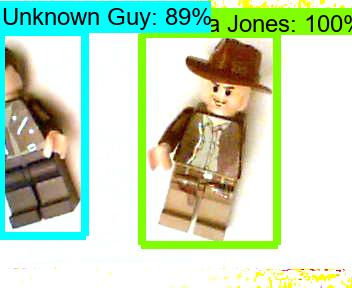

Scores:  [0.99996656 0.77335346 0.17933124]
Boxes:  [[0.19589941 0.3243088  0.88664913 0.8109285 ]
 [0.29187623 0.00282259 0.7932304  0.13156512]
 [0.2879488  0.00327266 0.8012307  0.13521826]]
Classes:  [1 3 2]


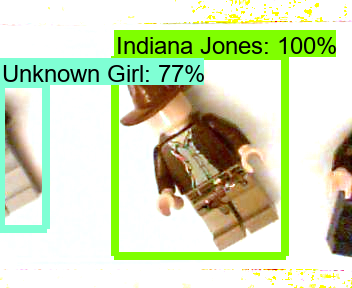

Scores:  [0.9976251  0.9403781  0.13320264]
Boxes:  [[0.10193199 0.2760668  0.80502206 0.63803387]
 [0.18944974 0.00416971 0.7709319  0.17954332]
 [0.16741249 0.00450535 0.7803884  0.18056414]]
Classes:  [1 3 2]


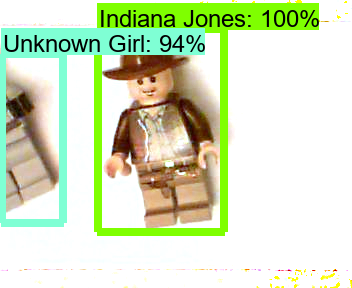

Scores:  [0.9996294  0.07569999 0.05237305]
Boxes:  [[0.18556815 0.11104055 0.85721064 0.5566887 ]
 [0.17285533 0.92562896 0.7484897  0.99787563]
 [0.17285533 0.92562896 0.7484897  0.99787563]]
Classes:  [1 2 3]


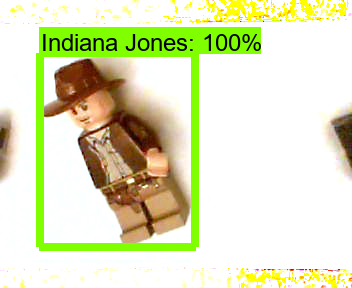

Scores:  [0.9931086  0.08391401 0.01549095]
Boxes:  [[0.3640879  0.32450163 0.82133114 0.93012524]
 [0.3898907  0.30590436 0.8293675  0.921461  ]
 [0.635406   0.00221117 1.         0.34692353]]
Classes:  [1 3 2]


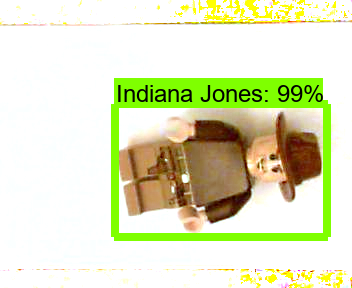

Scores:  [0.9995837  0.98782885 0.37897363]
Boxes:  [[0.13369027 0.37698448 0.8456436  0.756912  ]
 [0.18433858 0.00377927 0.704037   0.22252527]
 [0.19443543 0.84299153 0.8241477  0.9998315 ]]
Classes:  [1 3 2]


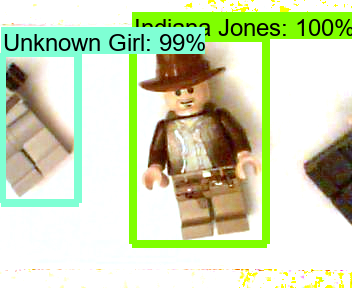

Scores:  [0.9999079  0.49260408 0.06432396]
Boxes:  [[0.3207697  0.35074502 0.8040733  0.75530726]
 [0.3548359  0.00498894 0.8353518  0.11938532]
 [0.2083394  0.9481107  0.8367301  0.9981283 ]]
Classes:  [1 2 3]


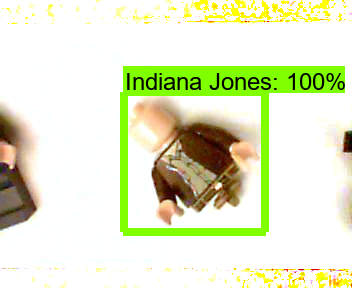

Scores:  [0.99926686 0.81963533 0.5094513 ]
Boxes:  [[0.122866   0.50689435 0.8566421  0.88453317]
 [0.05424281 0.00171118 0.7498092  0.19078231]
 [0.04019948 0.00152456 0.74900174 0.18856788]]
Classes:  [1 3 2]


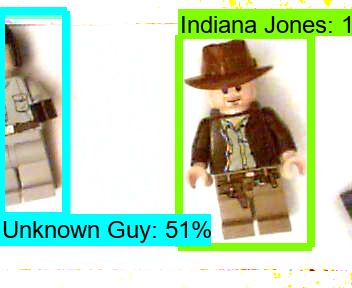

Scores:  [0.99955857 0.8671456  0.08546308]
Boxes:  [[1.7476857e-01 4.5511824e-01 7.9277313e-01 8.3216137e-01]
 [2.9991117e-01 3.2333359e-03 8.0631608e-01 1.9997165e-01]
 [3.1341329e-01 6.9088489e-04 7.9949307e-01 1.9807804e-01]]
Classes:  [1 2 3]


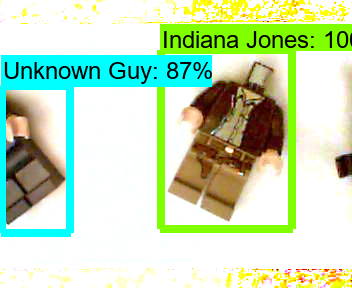

Scores:  [0.99958956 0.96974707 0.07159427]
Boxes:  [[0.1725489  0.35577637 0.8792924  0.7737023 ]
 [0.1838642  0.00205298 0.7660016  0.3150409 ]
 [0.41660133 0.95441127 0.8537056  1.        ]]
Classes:  [1 3 2]


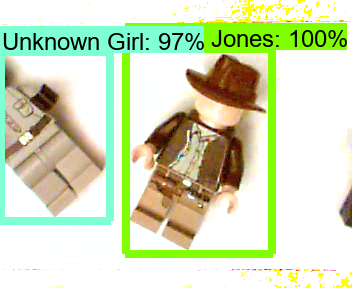

Scores:  [0.999597   0.96996474 0.5123204 ]
Boxes:  [[0.13272543 0.18317893 0.8229229  0.6452029 ]
 [0.19766906 0.         0.7118243  0.18224615]
 [0.26836705 0.8133989  0.8684533  0.9990333 ]]
Classes:  [1 3 2]


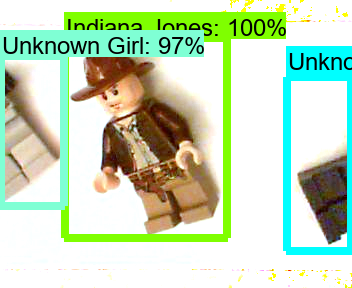

Scores:  [0.99489033 0.9852061  0.9576342 ]
Boxes:  [[0.08639526 0.2814346  0.8142037  0.68872863]
 [0.25743306 0.00441953 0.77423114 0.20535812]
 [0.21720694 0.753755   0.6759866  0.9984443 ]]
Classes:  [1 3 2]


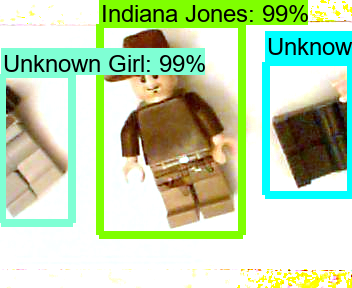

Scores:  [0.997272  0.9290731 0.2763   ]
Boxes:  [[1.1802375e-01 5.7540184e-01 8.5376376e-01 9.7860879e-01]
 [3.0407009e-01 1.2102723e-03 9.0339506e-01 2.9391295e-01]
 [3.0538717e-01 8.9903176e-04 9.1099775e-01 2.9346120e-01]]
Classes:  [1 3 2]


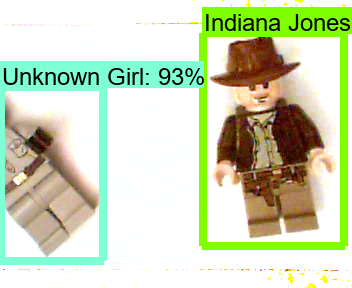

Scores:  [0.9994075  0.49120814 0.05911568]
Boxes:  [[1.73685625e-01 3.66176546e-01 8.39847267e-01 7.43997753e-01]
 [3.50982666e-01 5.07369637e-04 8.21816623e-01 1.22059301e-01]
 [3.47729266e-01 7.99763575e-03 8.45672846e-01 1.18150204e-01]]
Classes:  [1 2 3]


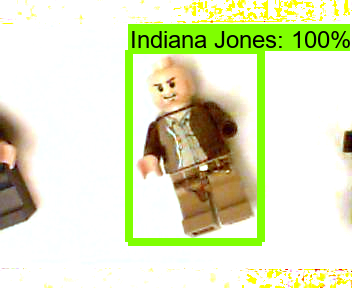

Scores:  [0.9994143  0.9406092  0.24521577]
Boxes:  [[0.17456448 0.50088155 0.9086313  0.9157171 ]
 [0.30895078 0.00153869 0.9030095  0.29239145]
 [0.30953383 0.0009332  0.9107041  0.29187158]]
Classes:  [1 3 2]


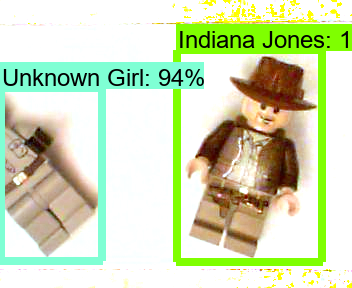

Scores:  [0.9982241  0.25340945 0.04594946]
Boxes:  [[0.22450936 0.35375378 0.8119564  0.9247781 ]
 [0.05542555 0.00425029 0.5814257  0.16428794]
 [0.22450936 0.35375378 0.8119564  0.9247781 ]]
Classes:  [1 3 2]


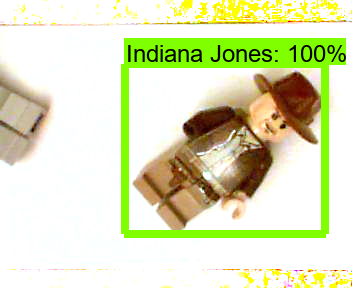

Scores:  [0.99969566 0.9746463  0.04686755]
Boxes:  [[2.5332862e-01 4.0632090e-01 8.4845543e-01 9.8159337e-01]
 [2.2139771e-01 5.8810413e-04 8.1277406e-01 2.6003146e-01]
 [2.5164542e-01 4.0257719e-01 8.5250783e-01 9.8318422e-01]]
Classes:  [1 3 2]


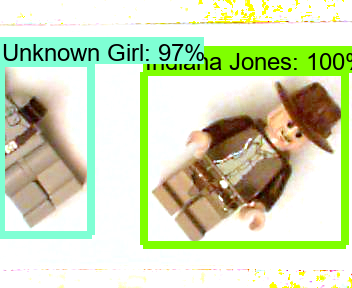

Scores:  [0.94791245 0.26980013 0.06202382]
Boxes:  [[2.2365868e-01 6.4514577e-04 7.3353338e-01 3.1601274e-01]
 [2.3181951e-01 1.8982664e-02 1.0000000e+00 3.3066905e-01]
 [8.0663413e-01 0.0000000e+00 1.0000000e+00 1.0000000e+00]]
Classes:  [2 3 1]


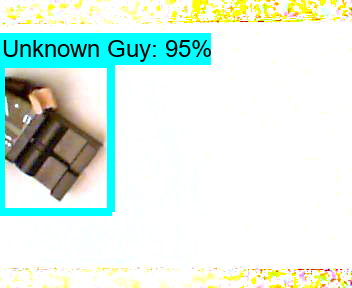

Scores:  [0.9986417  0.9821619  0.06449854]
Boxes:  [[0.11886947 0.43804038 0.8475672  0.82296646]
 [0.17830728 0.         0.67283595 0.27168348]
 [0.18544252 0.         0.67296433 0.28833622]]
Classes:  [1 3 2]


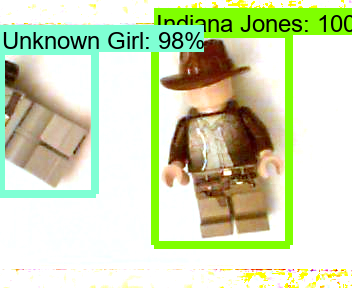

Scores:  [0.99957335 0.9233304  0.19015944]
Boxes:  [[0.13078603 0.48318654 0.8709813  0.8797172 ]
 [0.05303187 0.00215842 0.75770867 0.19150764]
 [0.04566042 0.0014624  0.7490098  0.19019166]]
Classes:  [1 3 2]


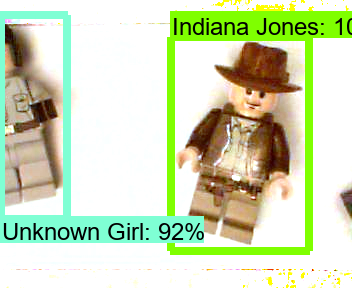

Scores:  [0.99990946 0.80840135 0.13045019]
Boxes:  [[0.25583443 0.18791997 0.7787215  0.6012396 ]
 [0.21543854 0.8203895  0.78056663 0.99715984]
 [0.05166051 0.         0.68382764 0.13359357]]
Classes:  [1 2 3]


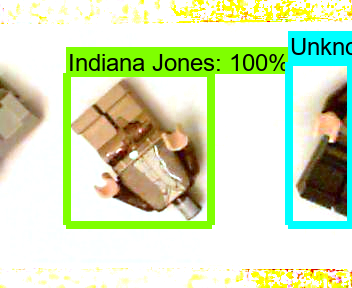

Scores:  [0.99063444 0.08978918 0.02571666]
Boxes:  [[0.20025839 0.45311522 0.84516096 0.98852134]
 [0.20025839 0.45311522 0.84516096 0.98852134]
 [0.2214054  0.4489016  0.8527085  0.9898117 ]]
Classes:  [3 2 1]


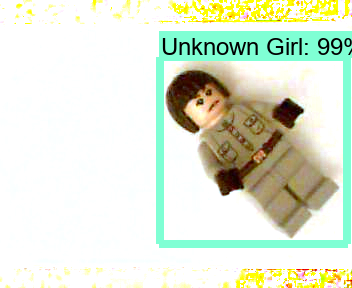

Scores:  [0.99952525 0.17918581 0.07773498]
Boxes:  [[0.13745117 0.30329493 0.83021724 0.8083292 ]
 [0.21996544 0.00285    0.76537615 0.1957549 ]
 [0.13745117 0.30329493 0.83021724 0.8083292 ]]
Classes:  [1 3 2]


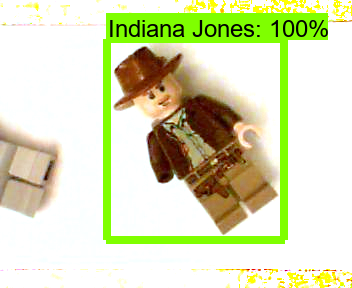

Scores:  [0.99539167 0.70875126 0.4251439 ]
Boxes:  [[0.11933193 0.4086901  0.8278653  0.849758  ]
 [0.17965072 0.00167584 0.85754013 0.17588168]
 [0.18101425 0.00154118 0.85280615 0.17679556]]
Classes:  [1 3 2]


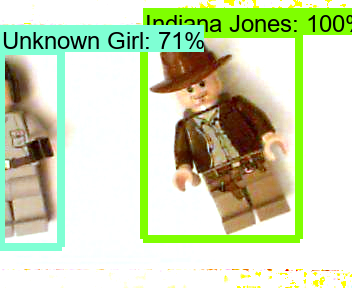

Scores:  [0.9999057  0.7440156  0.03879246]
Boxes:  [[0.19930099 0.41795978 0.9322186  0.91710734]
 [0.33604312 0.00144164 0.8047056  0.15880871]
 [0.06827264 0.         0.51807964 0.04420247]]
Classes:  [1 2 3]


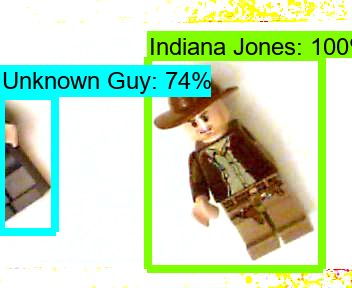

Scores:  [0.998719   0.9003867  0.33949447]
Boxes:  [[0.1391736  0.35500157 0.84572065 0.7196996 ]
 [0.19983943 0.00355253 0.55250394 0.22131488]
 [0.23355006 0.8408673  0.9063625  0.9992914 ]]
Classes:  [1 3 2]


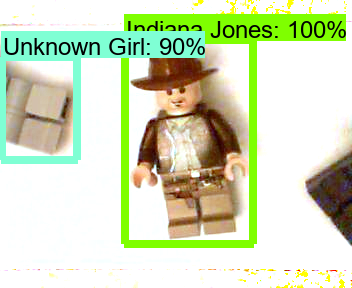

Scores:  [0.99866617 0.83208114 0.18772423]
Boxes:  [[0.21651407 0.3006368  0.8634005  0.70209014]
 [0.29169136 0.00297845 0.7893396  0.13567919]
 [0.2892282  0.00322941 0.7958425  0.13912867]]
Classes:  [1 3 2]


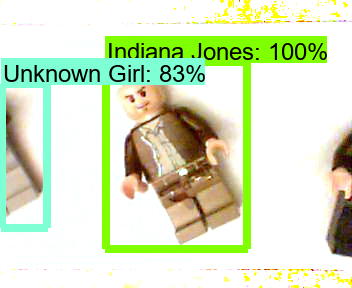

Scores:  [0.9963229  0.86723673 0.40283617]
Boxes:  [[0.07487426 0.45614195 0.81350404 0.82946837]
 [0.05152831 0.00204011 0.7572102  0.19089991]
 [0.0443514  0.00138973 0.7488507  0.18935329]]
Classes:  [1 3 2]


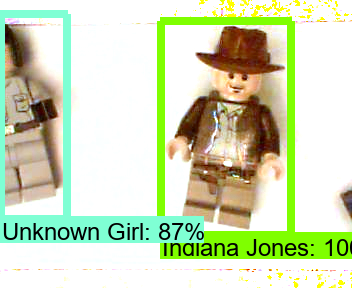

Scores:  [0.99907506 0.16304666 0.1120978 ]
Boxes:  [[0.16895585 0.60606873 0.9242994  0.9854717 ]
 [0.28935602 0.00254279 0.73612905 0.20921844]
 [0.04559013 0.0023732  0.73285055 0.22854847]]
Classes:  [1 2 3]


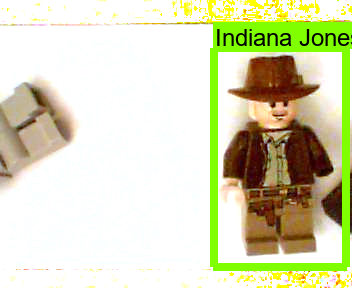

Scores:  [0.9945946  0.98744625 0.02718735]
Boxes:  [[0.15013717 0.5419693  0.8940616  0.94893074]
 [0.25345913 0.00409631 0.77626336 0.21021949]
 [0.2199738  0.01721648 0.85959005 0.22400767]]
Classes:  [1 3 2]


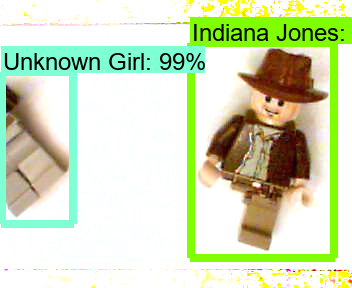

Scores:  [0.99840295 0.95341563 0.14950562]
Boxes:  [[0.21240677 0.25476342 0.7716448  0.8215763 ]
 [0.2172625  0.00542585 0.5633843  0.21749479]
 [0.2012265  0.8642322  0.9077764  1.        ]]
Classes:  [1 3 2]


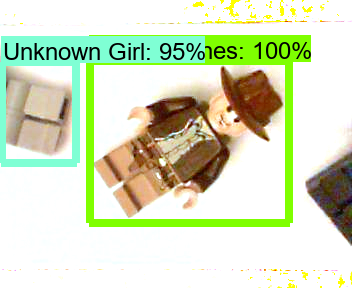

Scores:  [0.9971838  0.97850174 0.13897231]
Boxes:  [[9.6178085e-02 4.5962125e-01 8.5530126e-01 8.2900411e-01]
 [1.1535798e-01 4.9628317e-04 5.7327676e-01 3.3491850e-01]
 [1.1804937e-01 0.0000000e+00 5.7600379e-01 3.3925915e-01]]
Classes:  [1 3 2]


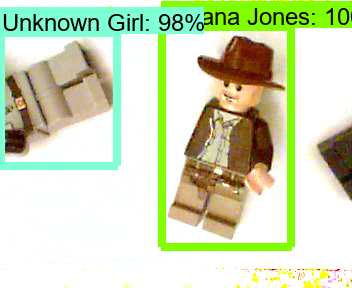

Scores:  [0.99964756 0.9746376  0.12043878]
Boxes:  [[0.15228075 0.36430717 0.86382955 0.7410538 ]
 [0.22438203 0.00580957 0.7194928  0.230297  ]
 [0.2633176  0.855556   0.9533017  0.9968779 ]]
Classes:  [1 3 2]


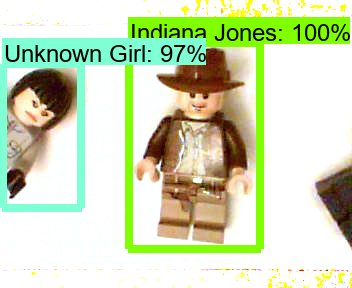

Scores:  [0.1241833  0.08307806 0.02959996]
Boxes:  [[0.87300307 0.         1.         1.        ]
 [0.8716108  0.         1.         0.6256956 ]
 [0.         0.         0.82828045 1.        ]]
Classes:  [1 3 2]


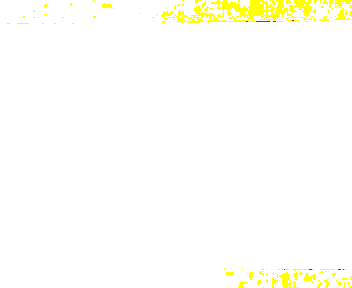

Scores:  [0.99776125 0.33225292 0.07139465]
Boxes:  [[0.13706198 0.44292015 0.8754146  0.83338505]
 [0.16167925 0.8970703  0.7337421  0.992273  ]
 [0.16167925 0.8970703  0.7337421  0.992273  ]]
Classes:  [1 3 2]


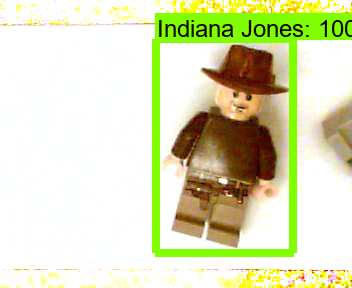

Scores:  [0.9999423  0.98757625 0.18926191]
Boxes:  [[2.0347910e-01 3.1708705e-01 8.5599828e-01 8.1203449e-01]
 [1.4119644e-01 3.2694638e-04 5.8952874e-01 3.2872015e-01]
 [2.1775335e-01 8.8205415e-01 7.6952475e-01 1.0000000e+00]]
Classes:  [1 3 2]


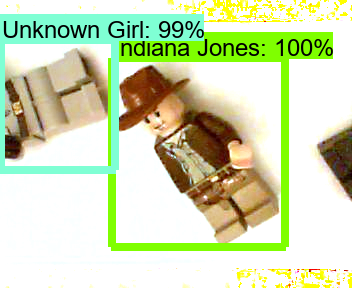

Scores:  [0.99693865 0.96716666 0.08597696]
Boxes:  [[1.1679576e-01 3.8273376e-01 8.2973146e-01 8.0749565e-01]
 [1.6890481e-01 6.2005222e-04 7.4103361e-01 3.2868832e-01]
 [1.7702867e-01 0.0000000e+00 7.4192089e-01 3.4818110e-01]]
Classes:  [1 3 2]


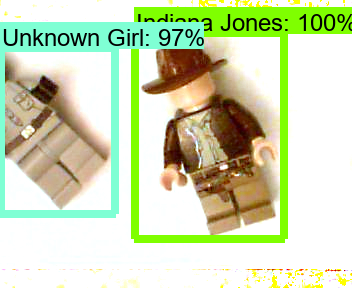

Scores:  [0.9988485  0.9070188  0.42849004]
Boxes:  [[0.18716355 0.30484486 0.91325176 0.680633  ]
 [0.07711548 0.00339722 0.7706561  0.22085968]
 [0.06213787 0.00565911 0.7754955  0.22162539]]
Classes:  [1 3 2]


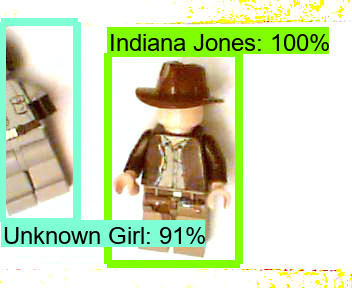

Scores:  [0.9993609 0.5821722 0.5623368]
Boxes:  [[1.4275016e-01 4.9512061e-01 8.6462158e-01 8.7612867e-01]
 [1.7447096e-01 1.7656535e-03 8.5268027e-01 1.7537971e-01]
 [1.7205884e-01 4.7536939e-04 8.5264981e-01 1.7402357e-01]]
Classes:  [1 2 3]


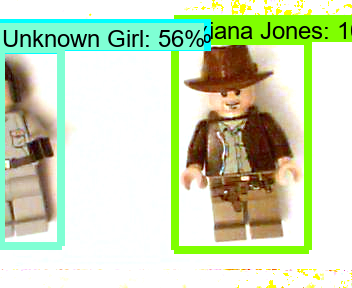

Scores:  [0.99985623 0.57352036 0.06109712]
Boxes:  [[0.21202403 0.27989963 0.80292565 0.64928246]
 [0.34683192 0.00553779 0.82001746 0.12432625]
 [0.3441569  0.00780116 0.8319694  0.12193574]]
Classes:  [1 2 3]


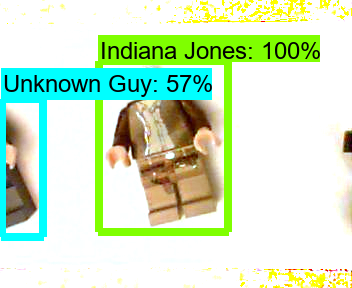

Scores:  [0.9986349 0.9773085 0.8739377]
Boxes:  [[1.8162672e-01 3.4118584e-01 8.5495484e-01 7.0206678e-01]
 [1.9045383e-01 2.5734305e-04 7.8679740e-01 2.6885268e-01]
 [1.7137627e-01 7.7862793e-01 9.1164839e-01 9.9652833e-01]]
Classes:  [1 3 2]


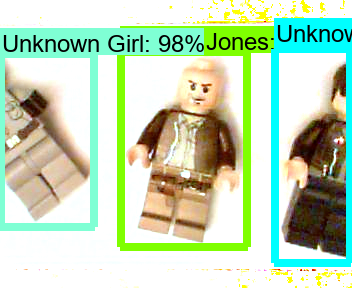

Scores:  [0.99806684 0.10700908 0.07401133]
Boxes:  [[0.09335757 0.31973463 0.801167   0.7442847 ]
 [0.25901487 0.00161162 0.8144307  0.05633253]
 [0.25901487 0.00161162 0.8144307  0.05633253]]
Classes:  [1 2 3]


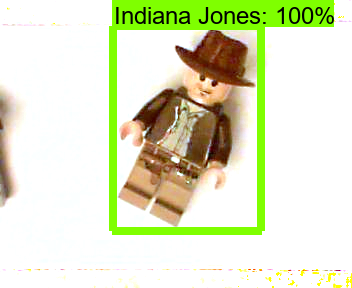

Scores:  [0.99934566 0.6865355  0.09362629]
Boxes:  [[2.9932168e-01 4.4823134e-01 8.6559325e-01 8.8605964e-01]
 [3.5986584e-01 2.3375452e-04 8.6375725e-01 1.5937385e-01]
 [3.0127278e-01 4.5317876e-01 8.6263585e-01 8.8579381e-01]]
Classes:  [1 2 3]


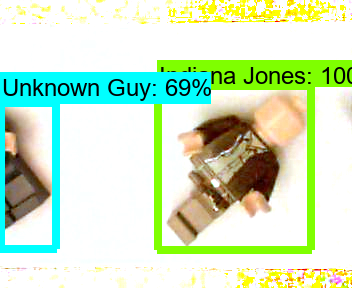

Scores:  [0.9967306  0.987551   0.03676432]
Boxes:  [[0.32146868 0.32447636 0.8109765  0.8805361 ]
 [0.25234714 0.00423363 0.7761498  0.20684792]
 [0.21580507 0.00848497 0.83341    0.22741686]]
Classes:  [1 3 2]


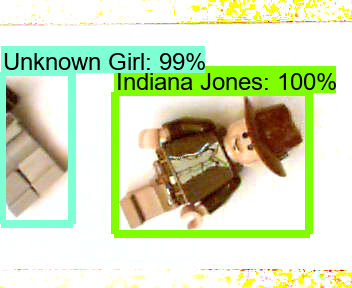

Scores:  [0.99802184 0.9712187  0.29450944]
Boxes:  [[0.12766454 0.3520436  0.84756905 0.7108258 ]
 [0.02896767 0.00331786 0.73016346 0.27296585]
 [0.03348893 0.         0.729796   0.2521514 ]]
Classes:  [1 3 2]


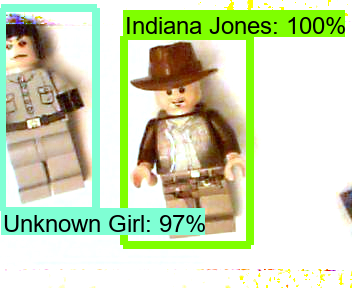

Scores:  [0.9987405  0.18077904 0.02766508]
Boxes:  [[0.15825891 0.5545067  0.9074771  0.9162608 ]
 [0.         0.00239403 0.5963279  0.18152955]
 [0.7268496  0.         1.         0.53657347]]
Classes:  [1 3 2]


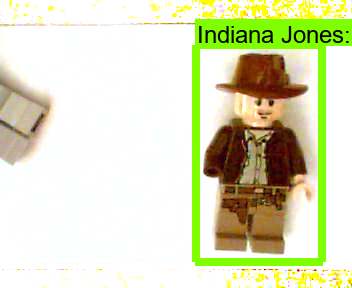

Scores:  [0.99901867 0.97676224 0.1763022 ]
Boxes:  [[1.5012857e-01 4.7145438e-01 8.6765265e-01 8.4810925e-01]
 [2.4479756e-01 3.9874762e-03 8.4126610e-01 2.1310239e-01]
 [2.3186602e-01 6.8347901e-04 8.4510010e-01 2.1607956e-01]]
Classes:  [1 3 2]


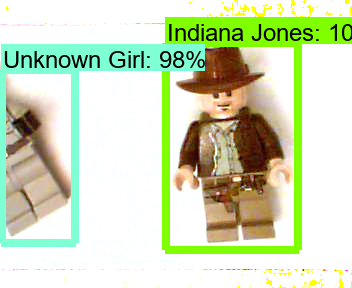

In [6]:
scores = []
boxes = []
classes = []

# read all images from folders given in a list
for imagePath in glob.glob('../../img/All/*.jpg'):

    img = cv2.imread(imagePath)
    if img is None:
        print("Error loading: " + imagePath)
        # end this loop iteration and move on to next image
        continue              
        
    # 1. compensate the background of the image
    img = utils.shadding(img, imgbackground)
    
    # 2. convert to correct colors and to numpy array
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_np = np.asarray(img, dtype='uint8')

    # 3. perform a call to the object detection network
    output_dict = utils.run_inference_for_single_image(model, img_np)
    scores.append(output_dict['detection_scores'])
    boxes.append(output_dict['detection_boxes'])
    classes.append(output_dict['detection_classes'])
    
    print('Scores: ', scores[-1])
    print('Boxes: ', boxes[-1])
    print('Classes: ', classes[-1])                     
    
    # 4. Print the results
    vis_util.visualize_boxes_and_labels_on_image_array(img_np, boxes[-1], classes[-1], scores[-1], category_index, instance_masks=output_dict.get('detection_masks_reframed', None), use_normalized_coordinates=True, line_thickness=8)
    display(Image.fromarray(img_np))

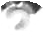

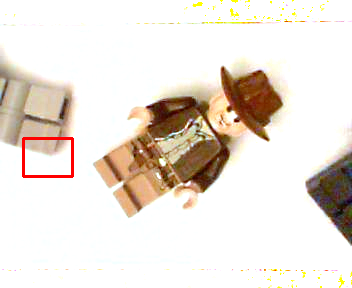

In [90]:
# read all images from folders given in a list
idx = 0
img_rgb = cv2.imread('../../img/templates/image_016.png') 
img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)

#img_rgb = rotate(img_rgb, angle=20)   

img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
template = cv2.imread('../../img/templates/hand.png',0) 

#template = rotate(template, angle=-22) 
display(Image.fromarray(template))

# Store width and height of template in w and h 
w, h = template.shape[::-1] 
  
# Perform match operations. 
res = cv2.matchTemplate(img_gray,template,cv2.TM_SQDIFF_NORMED) 
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

top_left = min_loc

bottom_right = (top_left[0] + w, top_left[1] + h)
cv2.rectangle(img_rgb,top_left, bottom_right, 255, 2)

display(Image.fromarray(img_rgb))
   

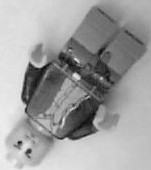

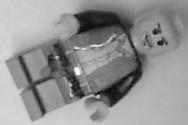

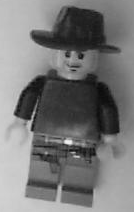

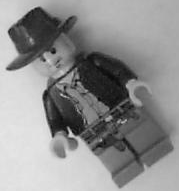

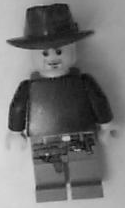

...

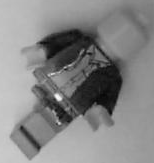

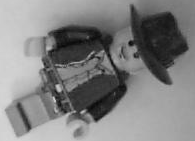

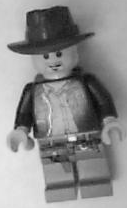

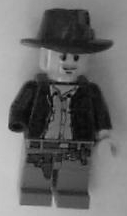

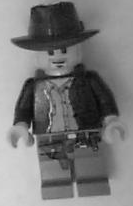

In [87]:
# read all images from folders given in a list
idx = 0
template = cv2.imread('../../img/templates/mask_body.png',0) 

# Store width and height of template in w and h 
template_w, template_h = template.shape[::-1] 

for imagePath in glob.glob('../../img/All/*.jpg'):
    img = cv2.imread(imagePath)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    height, width = img.shape
    
    for x in range(len(scores[idx])):        
        if scores[idx][x] > 0.97 and classes[idx][x] == 1:
            # Crop images in the bounding box region
            y_min = int(boxes[idx][x][0] * height)
            y_max = int(boxes[idx][x][2] * height)
            x_min = int(boxes[idx][x][1] * width)
            x_max = int(boxes[idx][x][3] * width)
            w = x_max - x_min
            h = y_max - y_min
            
            crop_img = img[y_min:y_min + h, x_min:x_min + w]                   
            
            #display(Image.fromarray(crop_img))
            
            # Rotate the image to the right position
            #correlation_score_arr = [None] * 360
            #for r in range(len(correlation_score_arr)): 
                #crop_img = rotate(crop_img, angle=r)                
                
            display(Image.fromarray(crop_img))
            
    idx = idx + 1     